<a href="https://colab.research.google.com/github/musicjae/Hands_on_ML/blob/master/(10)%20Intro_ANN/DNN_with_playground_tensorflow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 이미지 로드

In [31]:
from google.colab import files
uploaded = files.upload() # 파일 업로드 기능 실행

for fn in uploaded.keys(): # 업로드된 파일 정보 출력
    print('User uploaded file "{name}" with length {length} bytes'.format(
        name=fn, length=len(uploaded[fn])))

Saving 15.png to 15.png
User uploaded file "15.png" with length 906236 bytes


In [3]:
from IPython.display import Image

## 2.은닉층의 개수가 적은 경우

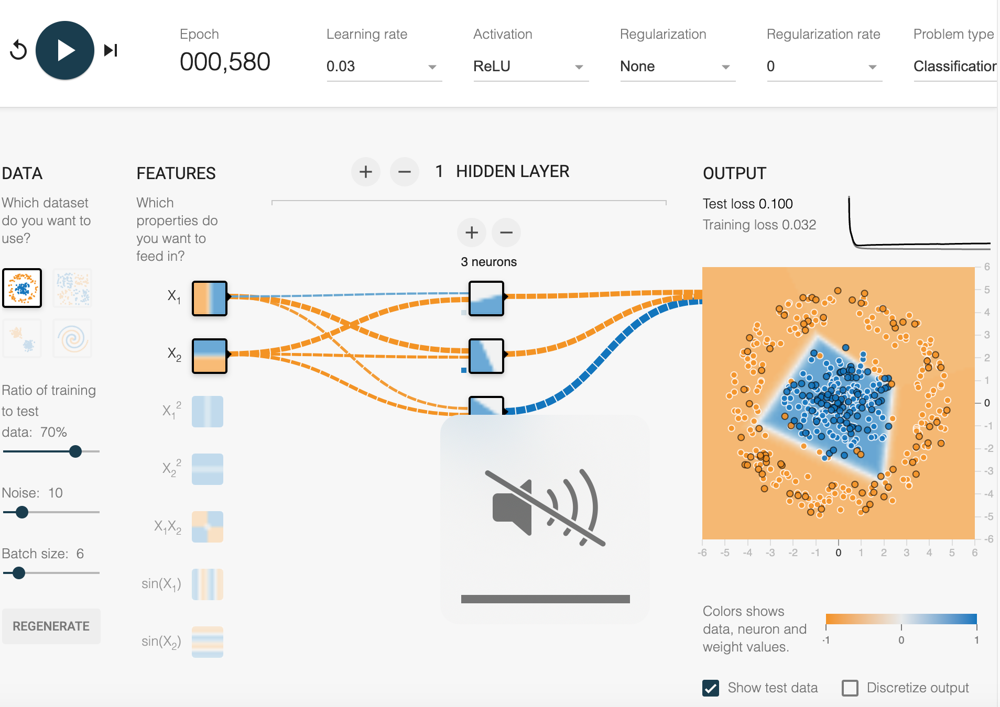

In [4]:
Image('1.png',width=600)

- 은닉층 1 개:  
> 훈련 시간 느림, 종종 지역 최솟값에 갇힘

## 3.적은 수의 뉴런 (작은 신경망)  
  
- 뉴런 2 개  
# > 좋은 loss 값 x, 과소적합

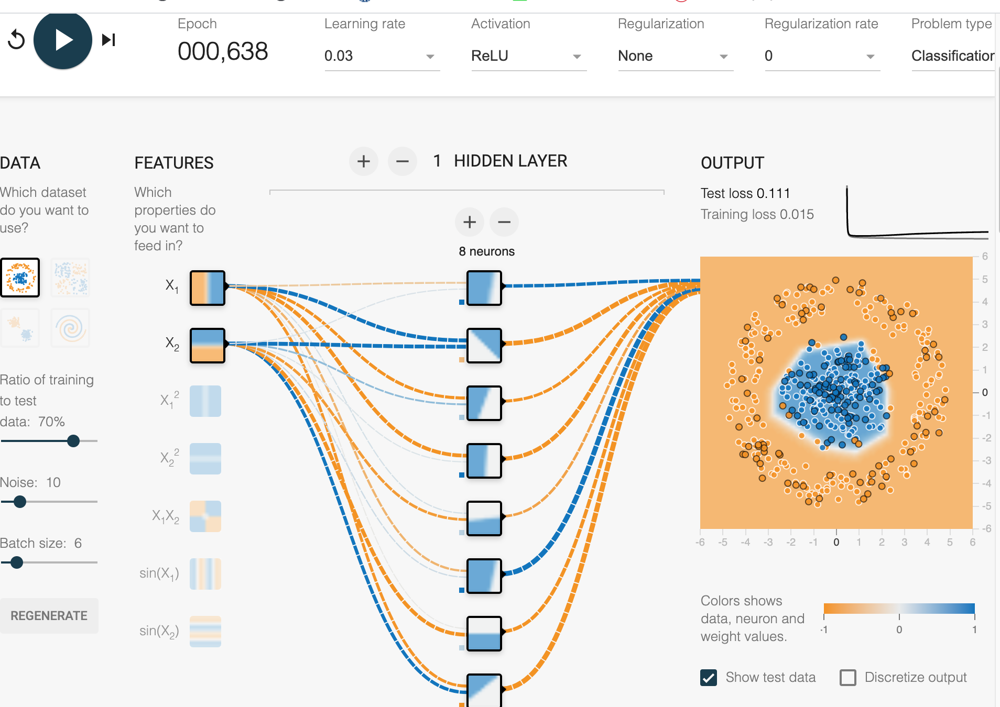

In [12]:
Image('3.png',width=600)

## 4.뉴런 수가 많은 경우 (대규모 신경망)  
  
- 8 개 뉴런  
> 국지적 최솟값에 빠지지 않는다. 만약 그렇더라도 전역 최솟값 만큼 좋다.

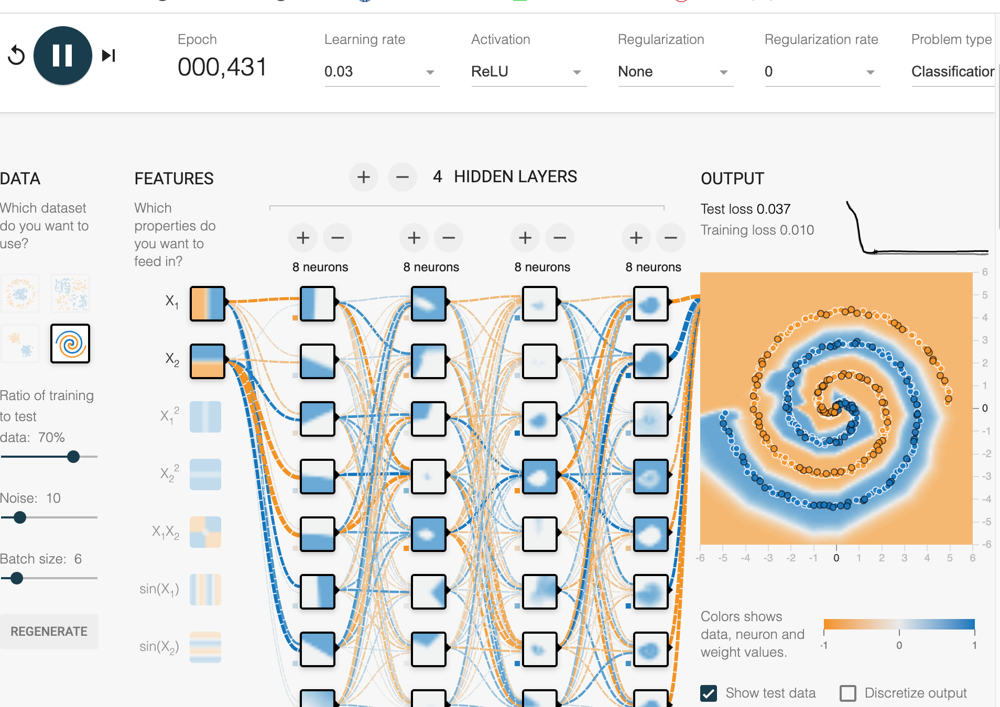

In [11]:
Image('4.png',width=600)

## 5.심층 신경망 (그래디언트 소실)  
  
- 8 개 뉴런, 4 개의 은닉층  
> -  epoch 당 학습 소요 시간이 증가 (느려짐) :(  
  - 더 낮은 loss :D,  
  - 가장 오른쪽에 있는 층(상위층)이 가장 왼쪽에 있는 층(하위층)의 뉴런 보다 더 빨리 학습되는 경향이 있어(**by그래디언트_소실**)  
    - ==> 이 문제는 가중치 초기화 및 다른 기법으로 해소 가능  


## 6.ReLU vs tanh  
 
400 - 500 에폭으로 돌릴 때, 이 경우에는 유의미한 loss 및 소요 시간 차이는 없었다. 하지만 일반적으로 ReLU가 여러 측면에서 더 좋다고 여겨진다.

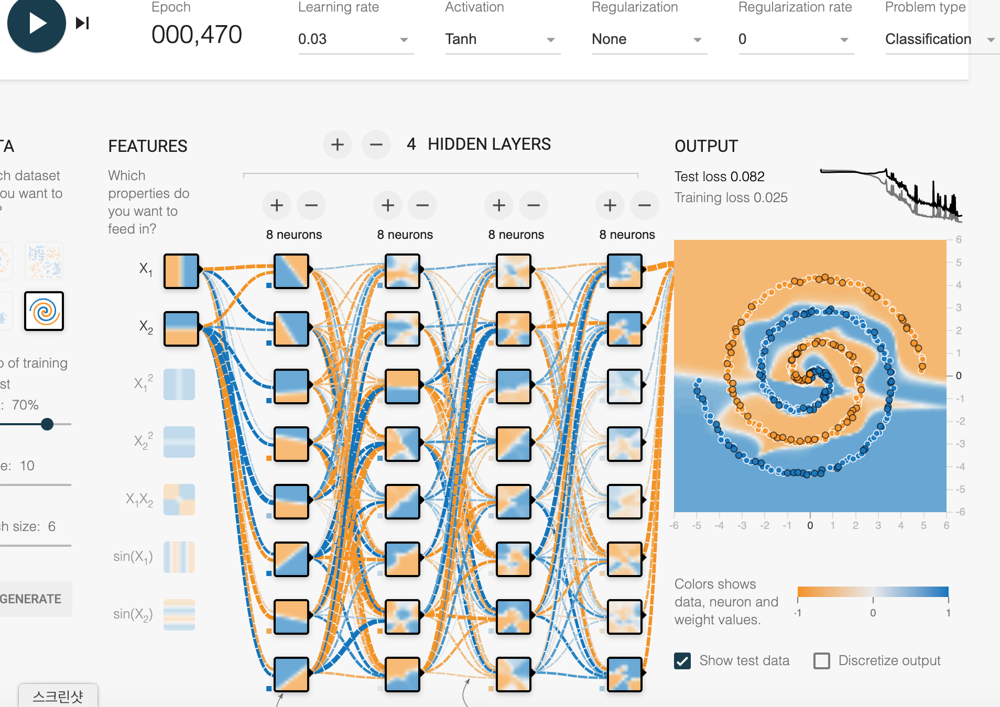

In [14]:
Image('5.png',width=600)

## 7.More #Hidden layer  


### tanh  
  
  
이번엔 위와 동일한 조건에서 은닉층을 6 개로 늘려봤다. tanh가 그래디언트 소실 문제에 취약해서 그런가 학습 과정이 불안정했다. 아래는 약 450 epoch까지 학습한 결과다.

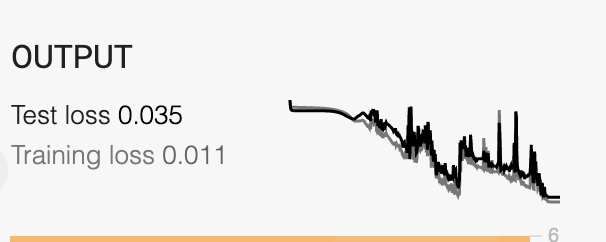

In [16]:
Image('6.png',width=600)

### ReLU  
  
렐루 경우에는 비교적 200 epoch까지는 안정적으로 학습을 했는데 그 이후부터는 불안정한 양상을 보였다.  
  
- 450epoch까지 학습

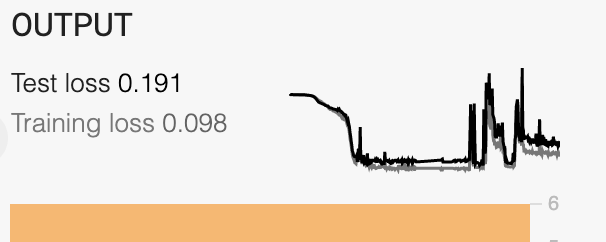

In [18]:
Image('7.png',width=600)

## 8.규제, regularization rate  
> 이것은 (1) 학습 알고리즘을 데이터에 맞추게 하고, (2) 모델의 가중치가 가능한 한 작게 유지되게끔 해준다.  

- 1. None  
- 2. L1  
- 3. L2

#### None

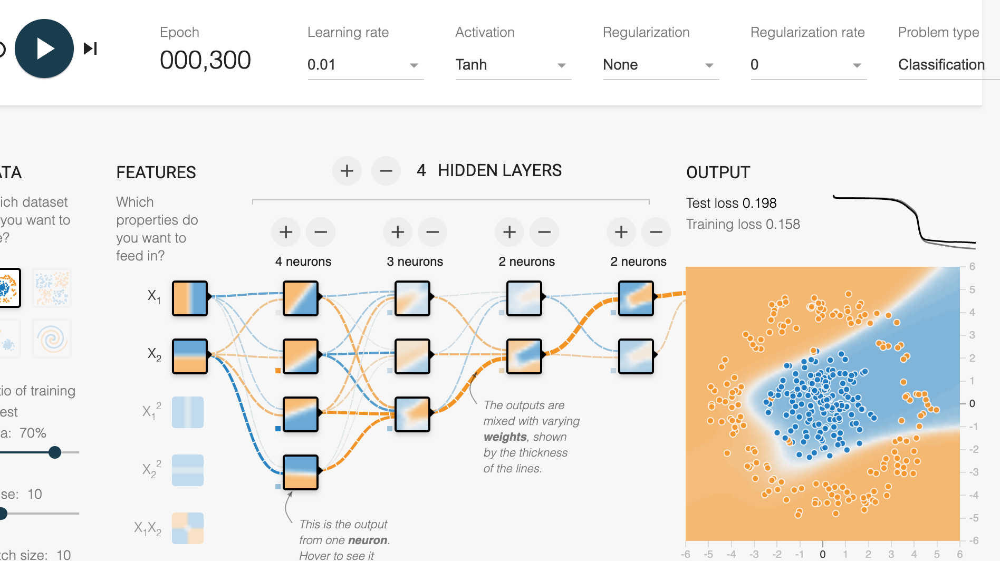

In [20]:
Image('8.png',width=600)

#### L1 (Lasso)
  
  - L1, reg_rate = 0.001

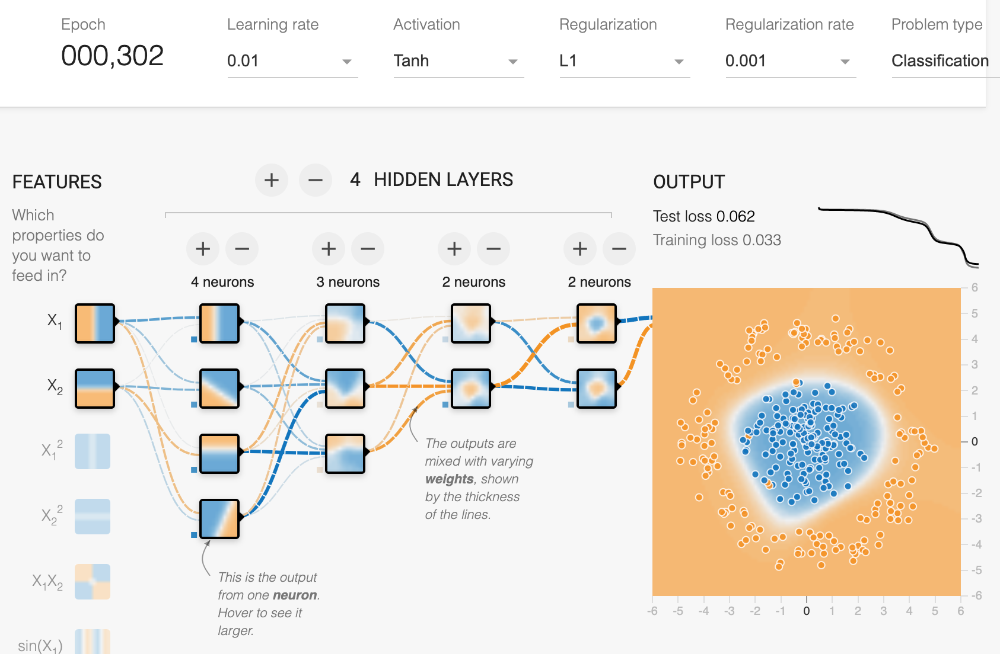

In [22]:
Image('9.png',width=600)

작은 reg_rate 에서는 더 학습이 잘되었다. 이것이 아마 이 모델에 적절한 값에 가깝지 않았을까 싶다.

- L1, reg_rate = 0.01  
  
반면에, rate를 10배 하니까 학습이 안되었다. 정규화율이 너무 크거나 적절치 않으면 오히려 학습이 안된다. 아래 그림에서 은닉층을 거칠수록 희미해지는 유닛들을 보면 왜 학습이 안되는지에 대한 직관적인 이해를 얻을 수 있는 것 같다.

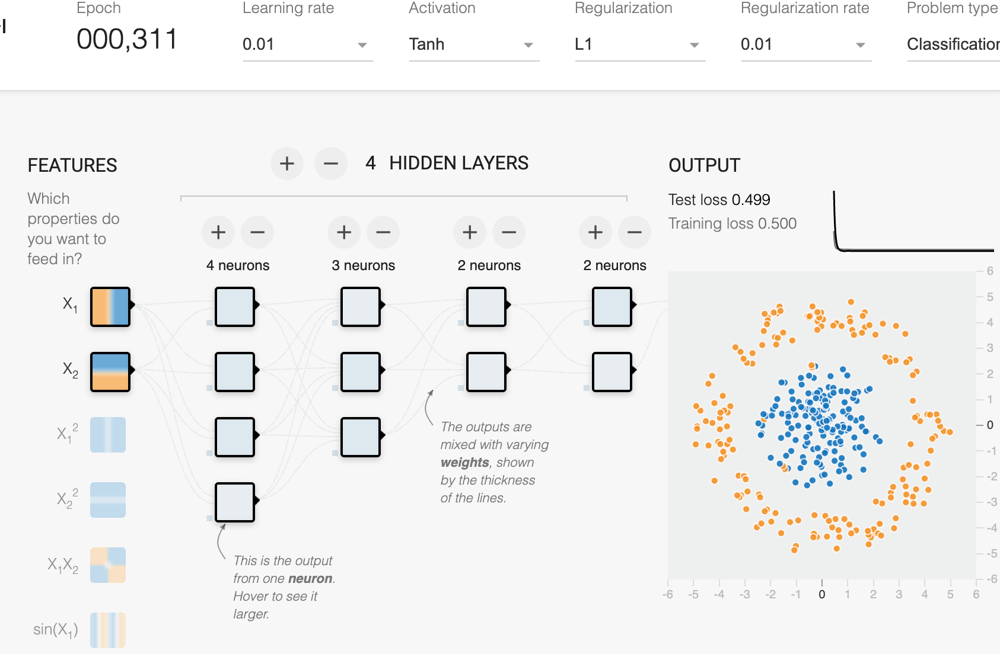

In [24]:
Image('11.png',width=600)

### L2 (Ridge)
  
- L2, reg=0.001  
  
L1 과 비교할 때 이것이 좀 더 좋은 성능을 보였다. 하지만 큰 차이는 아니었다.  
  
> 라쏘와의 차이점:  
  - param이 전역 최저점에 가까워질수록 grads 작아진다   
  - 경사하강법이 자동으로 느려지고 수렴에 도움이 된다

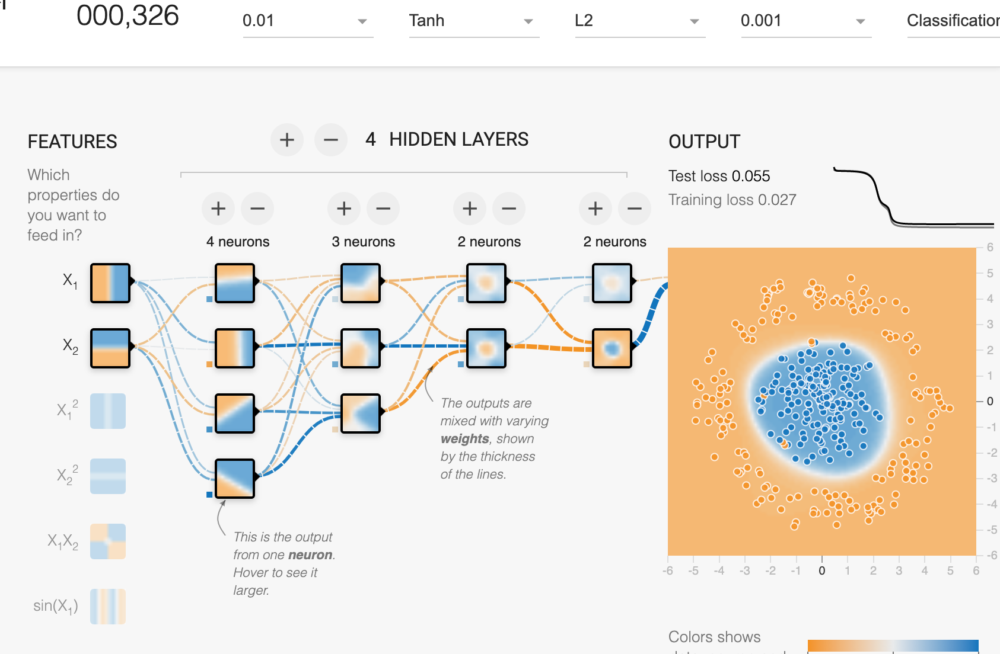

In [26]:
Image('12.png',width=600)

마찬가지로, reg 값이 크면 tanh를 활성화 함수로 채택하는 경우에 학습이 잘 되지 않았다.

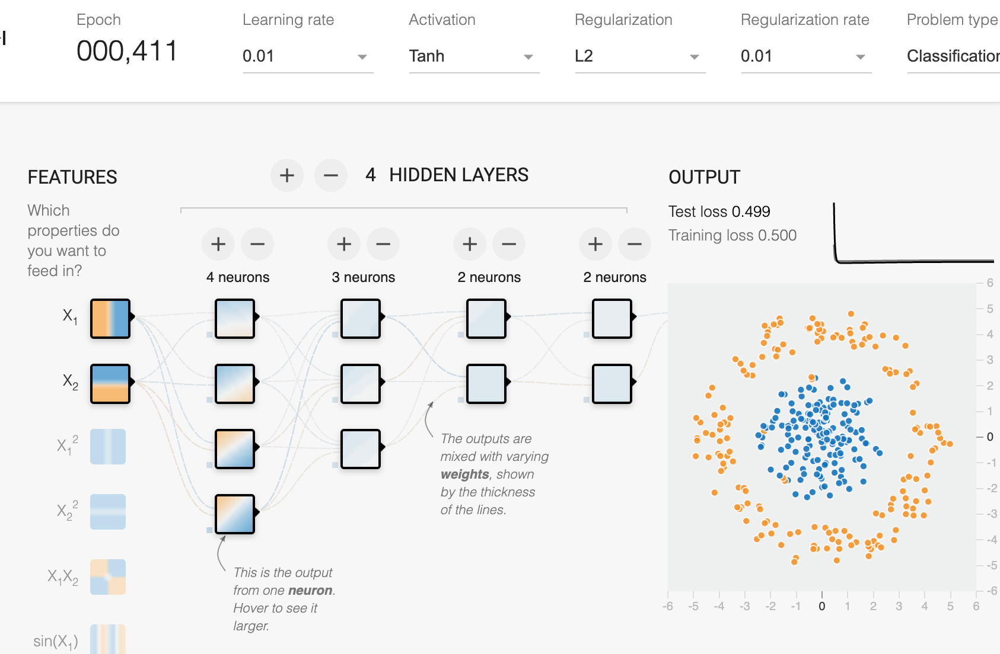

In [29]:
Image('13.png',width=600)

하지만 ReLU로 바꾸니 0.01의 비교적 큰 reg 값에도 어느 정도 학습이 되어 loss를 낮춘다는 것을 알 수 있었다.

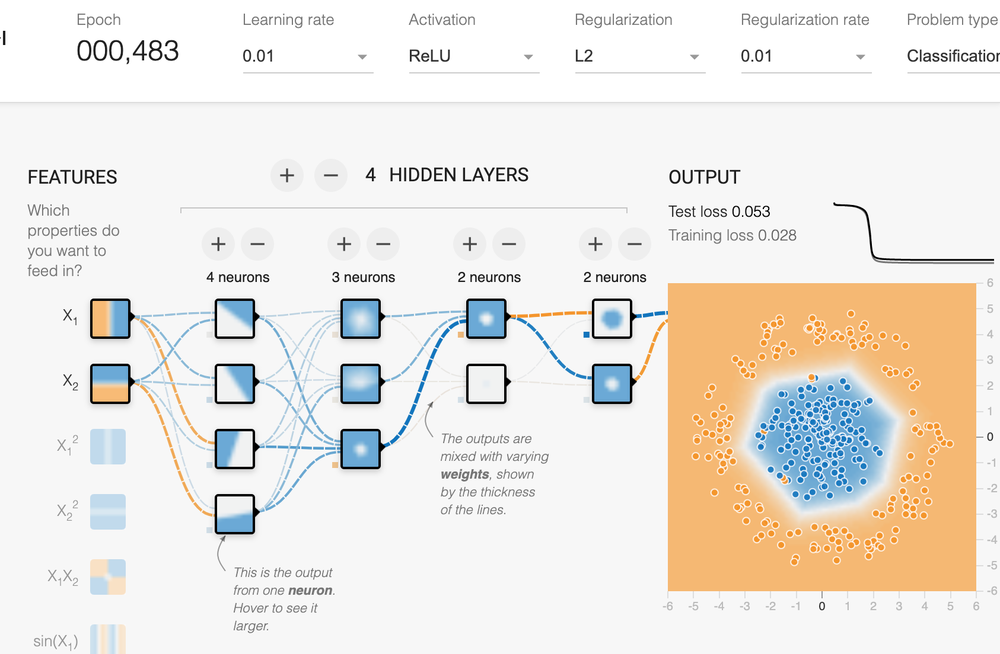

In [30]:
Image('14.png',width=600)

## 9.좋은 것만 갖다가 쓰기

- 뉴런 8 개, 은닉층 6 개, L2 + reg=0.001 + ReLU  
  
- epoch= 400-500

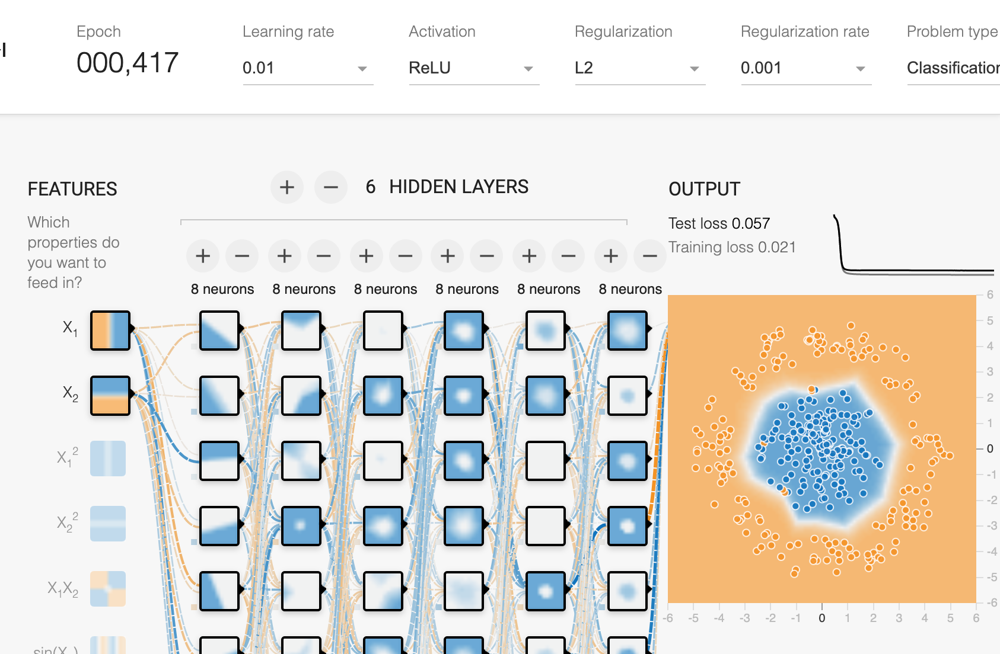

In [32]:
Image('15.png',width=600)

비교적 좋은 결과를 얻었다. 하지만 많은 소요 시간이 걸렸다. 좋은 것만 다 갖다가 쓴다고 해서 가장 좋은 결과를 얻는 것은 아니다. 

## Reference  
http://playground.tensorflow.org/